In [1]:
#importing necessary libraries
import os
import cv2
import numpy as np
from skimage.util import random_noise
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import Sequence
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
import math
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim
from tensorflow.keras.metrics import MeanAbsoluteError
from keras.layers import BatchNormalization, Activation, Dropout, concatenate
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import tensorflow as tf

## Function to add noise

In [2]:
# Function to add various types of noise to an image
def add_various_noises(image):
    noise_types = ['gaussian', 's&p', 'speckle', 'poisson']
    noisy_images = [random_noise(image, mode=noise_type) for noise_type in noise_types]
    return noisy_images

## Image Generaration

In [3]:
# Data Generator Class
class ImageDataGenerator(Sequence):
    def __init__(self, image_paths, batch_size, augment_function):
        self.image_paths = image_paths
        self.batch_size = batch_size
        self.augment_function = augment_function

    def __len__(self):
        # Adjusting length to account for the increased dataset size with noise variations + original images
        return math.ceil((len(self.image_paths) * (len(noise_types) + 1)) / self.batch_size)

    def __getitem__(self, idx):
        start = (idx * self.batch_size) // (len(noise_types) + 1)
        end = ((idx + 1) * self.batch_size) // (len(noise_types) + 1)
        batch_paths = self.image_paths[start:end]
        batch_x = []
        batch_y = []

        for path in batch_paths:
            image = cv2.imread(path)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
                image = image.astype('float32') / 255.
                augmented_images = self.augment_function(image)
                augmented_images.append(image)  # To include the original image

                for aug_image in augmented_images:
                    aug_image = np.array(aug_image).astype('float32')  
                    batch_x.append(aug_image)
                    batch_y.append(image)

                # Ensure the batch is not exceeding the specified size
                if len(batch_x) >= self.batch_size:
                    break

        # Making sure the batch size is exactly what was requested
        batch_x = batch_x[:self.batch_size]
        batch_y = batch_y[:self.batch_size]

        return np.array(batch_x), np.array(batch_y)


### Splitting Data for Training, Testing and Validation

In [4]:
# noise_types is defined 
noise_types = ['gaussian', 's&p', 'speckle', 'poisson']

# Paths loading and splitting 
folder = '/Users/chaitanyapavan/Downloads/content/Diabetic_Balanced_Data/train/0'
image_paths = [os.path.join(folder, filename) for filename in os.listdir(folder) if filename.lower().endswith(('.png', '.jpg', '.jpeg'))]

train_paths, test_paths = train_test_split(image_paths, test_size=0.2, random_state=42)
train_paths, val_paths = train_test_split(train_paths, test_size=0.25, random_state=42)


In [5]:
batch_size = 8

# Generator initialization 
train_generator = ImageDataGenerator(train_paths, batch_size, add_various_noises)
val_generator = ImageDataGenerator(val_paths, batch_size, add_various_noises)
test_generator = ImageDataGenerator(test_paths, batch_size, add_various_noises)

In [6]:
#to ensure all the images are same size
def check_image_sizes(folder):
    sizes = set()
    for filename in os.listdir(folder):
        path = os.path.join(folder, filename)
        image = cv2.imread(path)
        if image is not None:
            sizes.add(image.shape)  

    return len(sizes) == 1, sizes
same_size, sizes = check_image_sizes(folder)

if same_size:
    print("All images are of the same size.")
else:
    print("Images are of different sizes:", sizes)

All images are of the same size.


In [6]:
#dimensions of image
sample_image = cv2.imread(train_paths[0])
image_height, image_width, channels = sample_image.shape
sample_image.shape

(512, 512, 3)

## Building Denoising Autoencoders DAEs

In [4]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
from tensorflow.keras.models import Model

def build_denoising_autoencoder(input_shape=(512, 512, 3)):
    input_img = Input(shape=input_shape)
    
    # Encoder
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)

    x = Conv2D(128, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Dropout(0.2)(x)  # Regularization
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    
    # Bottleneck
    encoded = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    
    # Decoder
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    
    decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    
    # Model
    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')
    
    return autoencoder

autoencoder = build_denoising_autoencoder()
autoencoder.summary()


2024-04-18 02:07:49.905668: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-18 02:07:49.905690: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-18 02:07:49.905697: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-18 02:07:49.905731: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-18 02:07:49.905746: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 512, 512, 3)]     0         
                                                                 
 conv2d_4 (Conv2D)           (None, 512, 512, 128)     3584      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 256, 256, 128)     0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 256, 256, 128)     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 256, 256, 128)     147584    
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 128, 128, 128)     0         
 g2D)                                                        

## Hyperturning 

In [6]:
from tensorflow.keras.optimizers import Adam
from kerastuner import HyperModel

/var/folders/pl/tqnpqw0d0lg1qyvvvs2sk2kr0000gn/T/ipykernel_5326/1627102908.py:2: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import HyperModel


In [7]:
class DenoisingAutoencoderHyperModel(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        input_img = Input(shape=self.input_shape)
        x = input_img

        # Encoder: Dynamic number of layers and configurations
        for i in range(hp.Int('num_encoder_layers', 1, 5)):
            x = Conv2D(
                filters=hp.Int('filters_' + str(i), 32, 256, step=32),
                kernel_size=hp.Choice('kernel_size_' + str(i), [3, 5]),
                activation='relu',
                padding='same'
            )(x)
            if hp.Boolean('dropout_' + str(i)):
                x = Dropout(rate=hp.Float('dropout_rate_' + str(i), 0.2, 0.5))(x)
            x = MaxPooling2D((2, 2), padding='same')(x)

        # Bottleneck
        encoded = x

        # Decoder: mirroring the encoder
        for i in range(hp.get('num_encoder_layers') - 1, -1, -1):  # Reverse order
            x = Conv2D(
                filters=hp.get('filters_' + str(i)),
                kernel_size=hp.get('kernel_size_' + str(i)),
                activation='relu',
                padding='same'
            )(x)
            x = UpSampling2D((2, 2))(x)

        decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
        autoencoder = Model(input_img, decoded)

        # Compile model
        lr = hp.Float('learning_rate', 1e-4, 1e-2, sampling='log')
        autoencoder.compile(optimizer=tf.keras.optimizers.legacy.Adam(lr), loss='mean_squared_error')

        return autoencoder

In [8]:
from kerastuner.tuners import BayesianOptimization

hypermodel = DenoisingAutoencoderHyperModel(input_shape=(512, 512, 3))

In [9]:
tuner = BayesianOptimization(
    hypermodel,
    objective='val_loss',
    max_trials=20, 
    executions_per_trial=1,
    directory='my_dir',
    project_name='denoising_autoencoder'
)

2024-04-02 01:46:24.820659: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-02 01:46:24.820684: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-02 01:46:24.820690: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-02 01:46:24.820728: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-02 01:46:24.820745: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [10]:
tuner.search(train_generator, 
             validation_data=val_generator, 
             epochs=20, 
             callbacks=[EarlyStopping(monitor='val_loss', patience=5)])


Search: Running Trial #1

Value             |Best Value So Far |Hyperparameter
4                 |4                 |num_encoder_layers
160               |160               |filters_0
5                 |5                 |kernel_size_0
False             |False             |dropout_0
0.0016869         |0.0016869         |learning_rate

Epoch 1/20


2024-04-02 01:46:30.124770: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18639/18639 [==============================] - ETA: 0s - loss: 0.0016

2024-04-02 07:19:07.756565: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18639/18639 [==============================] - 21582s 1s/step - loss: 0.0016 - val_loss: 0.0010
Epoch 2/20
18639/18639 [==============================] - 21588s 1s/step - loss: 9.7988e-04 - val_loss: 9.6504e-04
Epoch 3/20
18639/18639 [==============================] - 21506s 1s/step - loss: 9.0642e-04 - val_loss: 8.3067e-04
Epoch 4/20
 6250/18639 [=========>....................] - ETA: 3:42:25 - loss: 8.7425e-04

KeyboardInterrupt: 

In [ ]:
# Getting the best model directly from the tuner
best_model = tuner.get_best_models(num_models=1)[0]

## Model Training

In [6]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model

In [7]:
# Define callbacks for further training
checkpoint_cb = ModelCheckpoint('best_model_further_trained.h5', save_best_only=True, monitor='val_loss')
early_stopping_cb = EarlyStopping(patience=10, restore_best_weights=True, monitor='val_loss')

In [13]:
# training the model
history = autoencoder.fit(
    train_generator, 
    validation_data=val_generator, 
    epochs=100, 
    callbacks=[checkpoint_cb, early_stopping_cb]
)

Epoch 1/100


2024-04-02 21:37:13.968814: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18639/18639 [==============================] - ETA: 0s - loss: 4.7681e-04

2024-04-03 00:45:32.887407: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


18639/18639 [==============================] - 12292s 659ms/step - loss: 4.7681e-04 - val_loss: 3.6712e-04
Epoch 2/100


/Users/chaitanyapavan/anaconda3/envs/tf_env/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


18639/18639 [==============================] - 12314s 661ms/step - loss: 2.6663e-04 - val_loss: 2.4022e-04
Epoch 3/100
18639/18639 [==============================] - 12378s 664ms/step - loss: 2.4175e-04 - val_loss: 2.3856e-04
Epoch 4/100
18639/18639 [==============================] - 12277s 659ms/step - loss: 2.3325e-04 - val_loss: 2.1884e-04
Epoch 5/100
18639/18639 [==============================] - 12281s 659ms/step - loss: 2.2907e-04 - val_loss: 2.3088e-04
Epoch 6/100
18639/18639 [==============================] - 12348s 662ms/step - loss: 2.2988e-04 - val_loss: 2.5656e-04
Epoch 7/100
18639/18639 [==============================] - 12356s 663ms/step - loss: 2.2148e-04 - val_loss: 2.8557e-04
Epoch 8/100
18639/18639 [==============================] - 12468s 669ms/step - loss: 2.1671e-04 - val_loss: 3.3032e-04
Epoch 9/100
18639/18639 [==============================] - 12442s 667ms/step - loss: 2.1394e-04 - val_loss: 4.6547e-04
Epoch 10/100
18639/18639 [==============================] - 

## GRAPHS

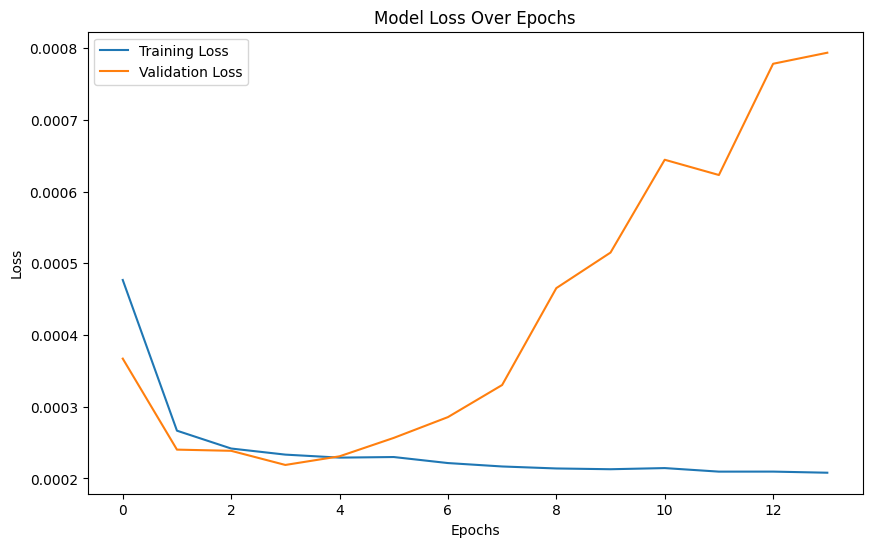

In [16]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [15]:
# Saving Model
autoencoder.save('denoising_autoencoder.h5')


/Users/chaitanyapavan/anaconda3/envs/tf_env/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Model Evaluavation 

In [8]:
from tensorflow.keras.models import load_model

# Loading the model
model = load_model('denoising_autoencoder.h5')

2024-04-14 23:17:51.715763: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-04-14 23:17:51.715830: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-04-14 23:17:51.715845: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-04-14 23:17:51.715926: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-14 23:17:51.715958: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [9]:
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error
import sewar
from piq import fsim
import torch
from concurrent.futures import ThreadPoolExecutor, as_completed

In [10]:
# Structural Similarity Index Metrics
def tf_ssim(original, denoised):
    # Convert images to float32 tensors
    original_tf = tf.convert_to_tensor(original, dtype=tf.float32)
    denoised_tf = tf.convert_to_tensor(denoised, dtype=tf.float32)

    # Calculating SSIM over the full image, range must be [0, 255]
    ssim = tf.image.ssim(original_tf, denoised_tf, max_val=255, filter_size=11)
    return ssim.numpy()  # Convert the result back to numpy

In [11]:
# Feature Similarity Index Metrics
def get_fsim(original, denoised):
    original_tensor = torch.tensor(original).permute(2, 0, 1).unsqueeze(0).float() / 255
    denoised_tensor = torch.tensor(denoised).permute(2, 0, 1).unsqueeze(0).float() / 255
    fsim_value = fsim(original_tensor, denoised_tensor)
    return fsim_value

In [12]:
def evaluate_model(generator, model):
    # Lists to store metric values
    psnrs, ssims, mses, fsims = [], [], [], []
    
    # Loop over all batches in the generator
    for i in range(len(generator)):
        batch_x, batch_y = generator[i]
        predicted = model.predict(batch_x)
        
        # Evaluate metrics for each image in the batch
        for j in range(len(batch_x)):
            # Scale and clip the images to 0-255 and convert to uint8
            original = np.clip(batch_y[j] * 255.0, 0, 255).astype("uint8")
            denoised = np.clip(predicted[j] * 255.0, 0, 255).astype("uint8")
            
            # Calculate PSNR, SSIM, MSE, and FSIM metrics
            psnr = peak_signal_noise_ratio(original, denoised, data_range=255)
            ssim = tf_ssim(original, denoised)
            mse = mean_squared_error(original, denoised)
            fsim_value = get_fsim(original, denoised)
            
            # Append metrics to their respective lists
            psnrs.append(psnr)
            ssims.append(ssim)
            mses.append(mse)
            fsims.append(fsim_value.item())

    # Calculate average values of the metrics
    avg_psnr = np.mean(psnrs)
    avg_ssim = np.mean(ssims)
    avg_mse = np.mean(mses)
    avg_fsim = np.mean(fsims)

    # Return the average metric values
    return avg_psnr, avg_ssim, avg_mse, avg_fsim


In [13]:
avg_psnr, avg_ssim, avg_mse, avg_fsim = evaluate_model(test_generator, model)
print("Average PSNR:", avg_psnr)
print("Average SSIM:", avg_ssim)
print("Average MSE:", avg_mse)
print("Average FSIM:", avg_fsim)

1/1 [==============================] - 0s 197ms/step


2024-04-14 23:17:58.262607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 122ms/step
Average PSNR: 39.12447230481602
Average SSIM: 0.9502241
Average MSE: 13.692930880483948
Average FSIM: 0.9870703995590371


In [19]:
print("Average PSNR:", avg_psnr)
print("Average SSIM:", avg_ssim)
print("Average MSE:", avg_mse)
print("Average FSIM:", avg_fsim)

Average PSNR: 39.12447230481602
Average SSIM: 0.9502241
Average MSE: 13.692930880483948
Average FSIM: 0.9870703995590371


## Visualizing Model's Predection

In [27]:
def plot_comparison(original, noisy, denoised):
    
    difference_img = (original - denoised)
    sum_of_difference = np.sum(difference_img)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(original)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    axes[1].imshow(noisy)
    axes[1].set_title('Noisy Image')
    axes[1].axis('off')

    axes[2].imshow(denoised)
    axes[2].set_title('Denoised by Model')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 0s 127ms/step


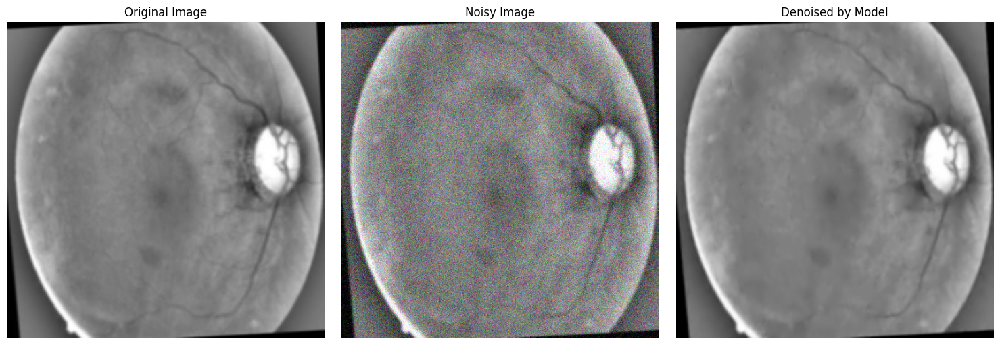

In [28]:
# Fetch images from the test generator
for batch_images, batch_labels in test_generator:
    noisy_images = batch_images  
    original_images = batch_labels  
    denoised_images = model.predict(noisy_images) 

    # Convert images back to display format
    original_images = np.clip(original_images * 255.0, 0, 255).astype('uint8')
    noisy_images = np.clip(noisy_images * 255.0, 0, 255).astype('uint8')
    denoised_images = np.clip(denoised_images * 255.0, 0, 255).astype('uint8')

    # Plot comparison for the first image in the batch
    plot_comparison(original_images[0], noisy_images[0], denoised_images[0])

    break 

## Visualizing Neural Network Layer Activations

In [30]:
from tensorflow.keras.models import Model

In [31]:
def get_activations(model, model_input, layer_names):
    # This function creates a sub-model that will output the activations of the specified layers
    outputs = [model.get_layer(name).output for name in layer_names]
    activation_model = Model(inputs=model.input, outputs=outputs)
    activations = activation_model.predict(model_input)
    return activations

In [32]:
def plot_activations(activations, layer_names):
    # Plot the activations of each layer
    for layer_activations, layer_name in zip(activations, layer_names):
        num_filters = layer_activations.shape[-1]
        size = layer_activations.shape[1]
        n_cols = num_filters // 16  # We will display 16 filters per row
        display_grid = np.zeros((size * n_cols, 16 * size))

        for col in range(n_cols):
            for row in range(16):
                filter_img = layer_activations[0, :, :, col * 16 + row]
                # Post-process the feature to make it visually palatable
                filter_img -= filter_img.mean()
                filter_img /= filter_img.std()
                filter_img *= 64
                filter_img += 128
                filter_img = np.clip(filter_img, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                             row * size : (row + 1) * size] = filter_img

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')


In [33]:
# Selecting an image
test_images, _ = next(iter(test_generator))  # Get a batch and take the first image
selected_image = test_images[0:1]  # We slice to keep batch dimension

In [38]:
# Specify layers to visualize
layer_names = ['input_1', 'conv2d_4', 'max_pooling2d_4', 'dropout_2', 'conv2d_5', 'max_pooling2d_5', 'conv2d_6', 'conv2d_11', 'up_sampling2d_4', 'conv2d_12', 'up_sampling2d_5', 'conv2d_13']

2024-04-15 03:18:40.989773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 314ms/step


/var/folders/pl/tqnpqw0d0lg1qyvvvs2sk2kr0000gn/T/ipykernel_1151/3624040709.py:26: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
/var/folders/pl/tqnpqw0d0lg1qyvvvs2sk2kr0000gn/T/ipykernel_1151/3624040709.py:14: RuntimeWarning: invalid value encountered in divide
  filter_img /= filter_img.std()
/var/folders/pl/tqnpqw0d0lg1qyvvvs2sk2kr0000gn/T/ipykernel_1151/3624040709.py:17: RuntimeWarning: invalid value encountered in cast
  filter_img = np.clip(filter_img, 0, 255).astype('uint8')
/Users/chaitanyapavan/anaconda3/envs/tf_env/lib/python3.8/site-packages/matplotlib/_tight_bbox.py:67: RuntimeWarning: divide by zero encountered in scalar divide
  fig.patch.set_bounds(x0 / w1, y0 / h1,
/Users/chaitanyapavan/anaconda3/envs/tf_env/lib/python3.8/site-packages/matplotlib/_tight_bbox.py:68: RuntimeWarning: divide by zero encountered in scalar divide
  fig.bbox.width / w1

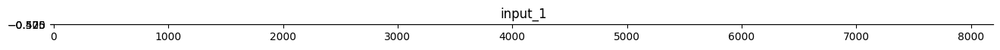

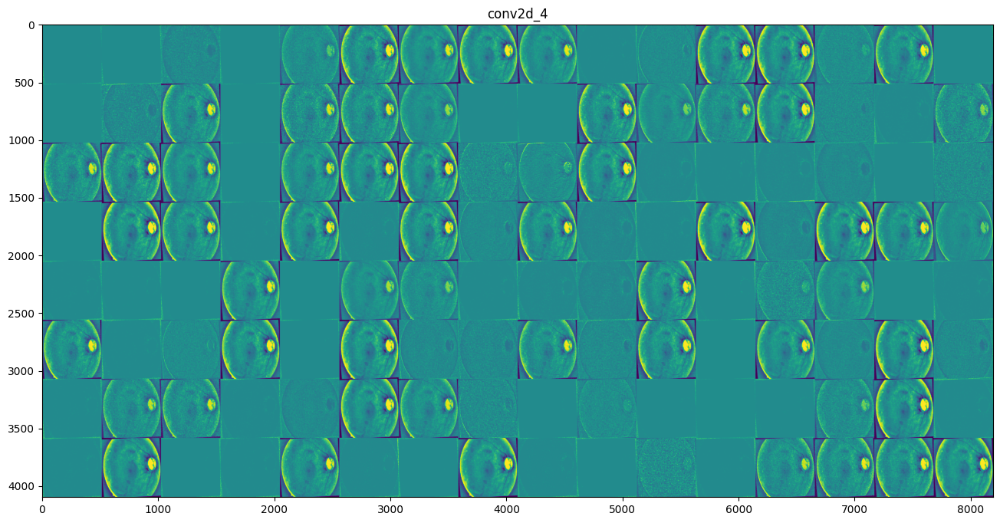

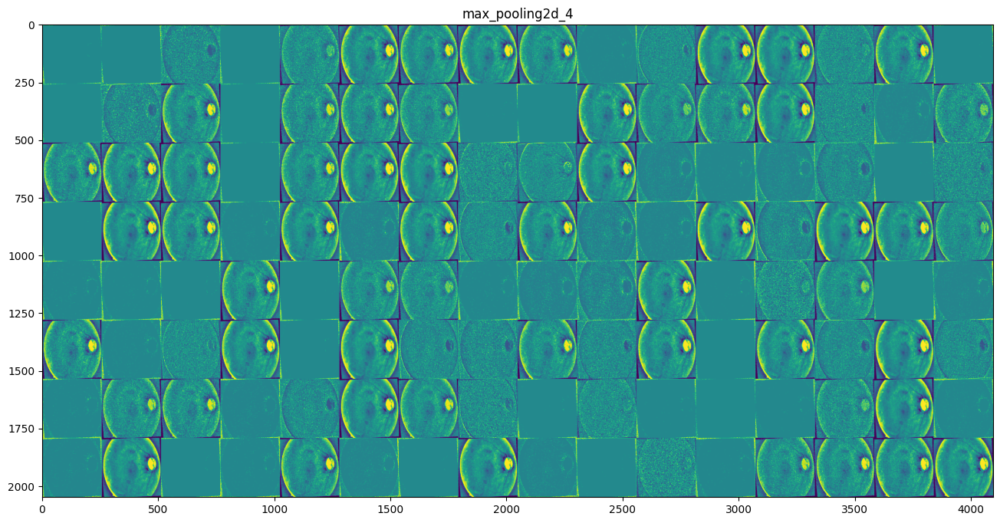

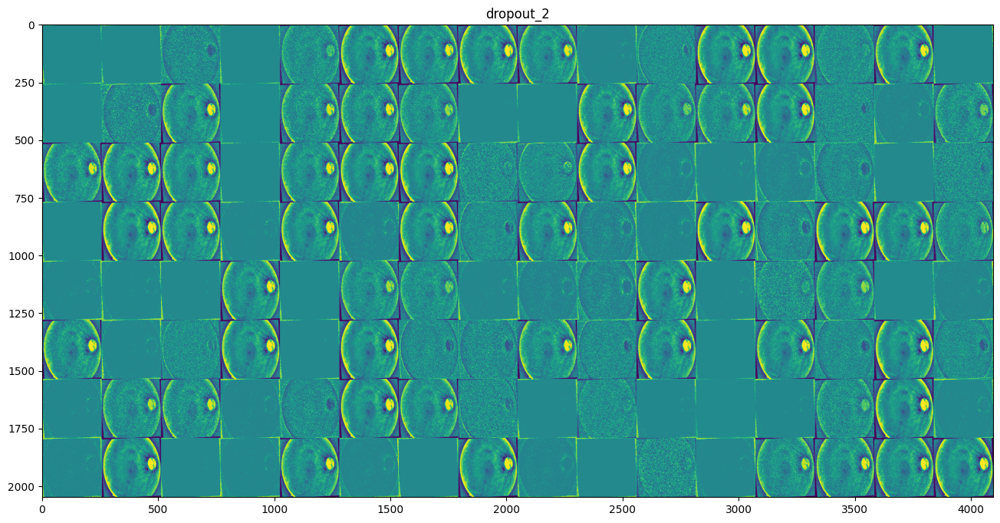

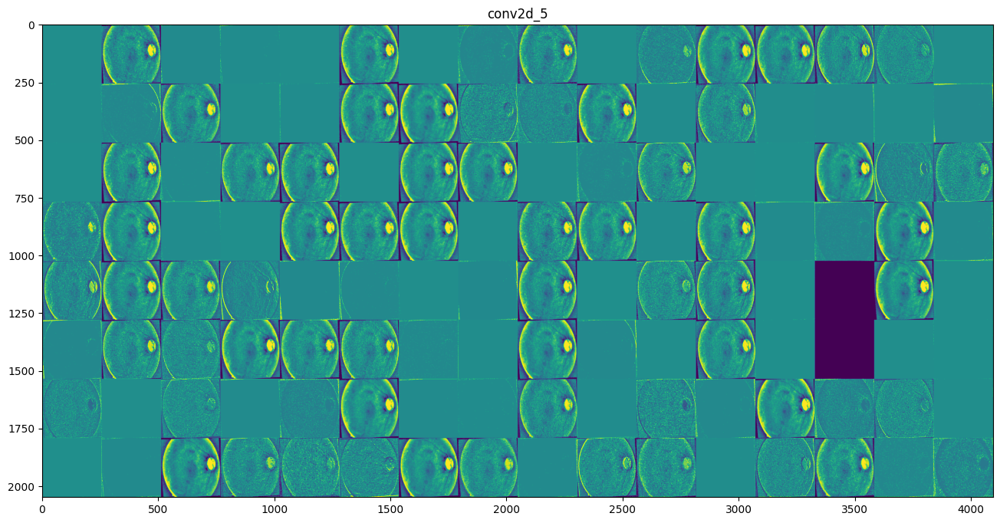

...

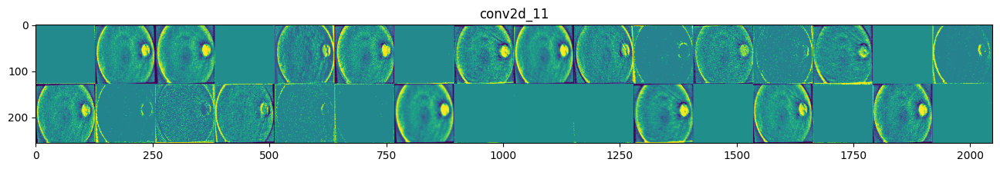

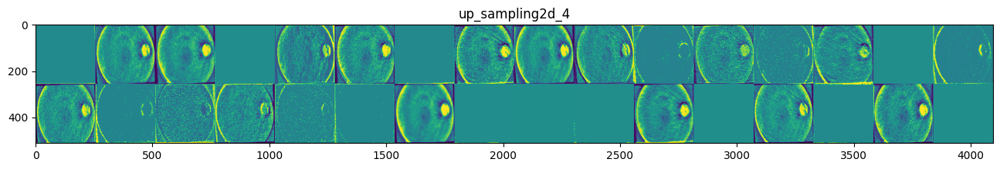

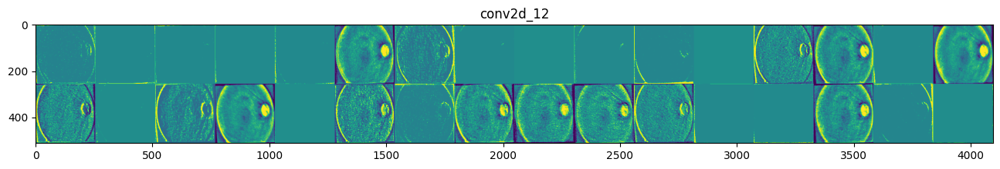

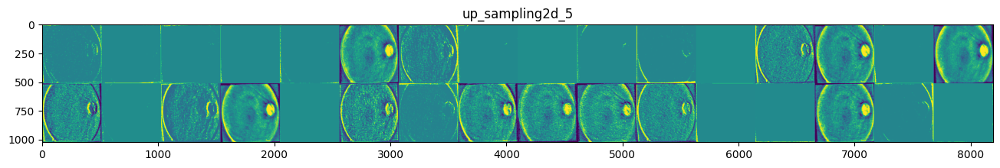

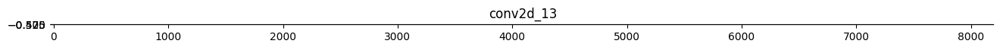

In [39]:
# Get activations and plot
activations = get_activations(autoencoder, selected_image, layer_names)
plot_activations(activations, layer_names)

## Model Architecture Visualization 

In [5]:
from tensorflow.keras.utils import plot_model

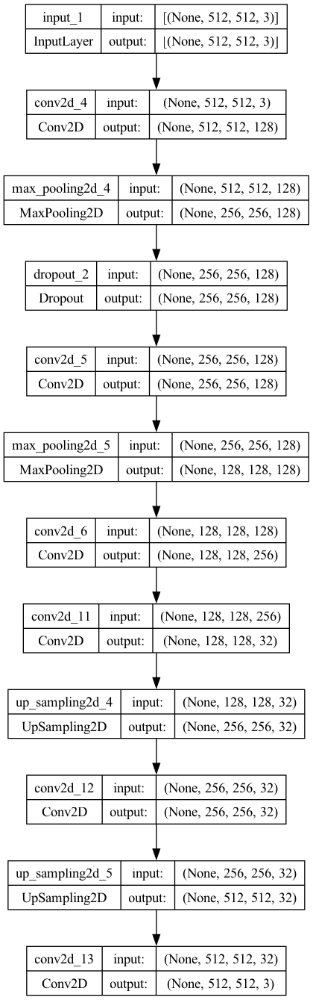

In [6]:
# Plotting model Architecture
plot_model(autoencoder, to_file='model_structure.png', show_shapes=True, show_layer_names=True)
